# Video Search with Azure Computer Vision 4 (Florence)
## 4 Search using an image or a prompt

![image](logo.jpg)

In [1]:
import datetime
import glob
import json
import os
import sys

from azure import (
    get_results_using_image,
    get_results_using_prompt,
    get_similar_images_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

from dotenv import load_dotenv
from PIL import Image

## 1. Informations

In [2]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [3]:
print("Today is", datetime.datetime.today())

Today is 2023-09-25 13:31:36.564905


## 2. Frames

In [4]:
IMAGES_DIR = "frames"

In [5]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,448


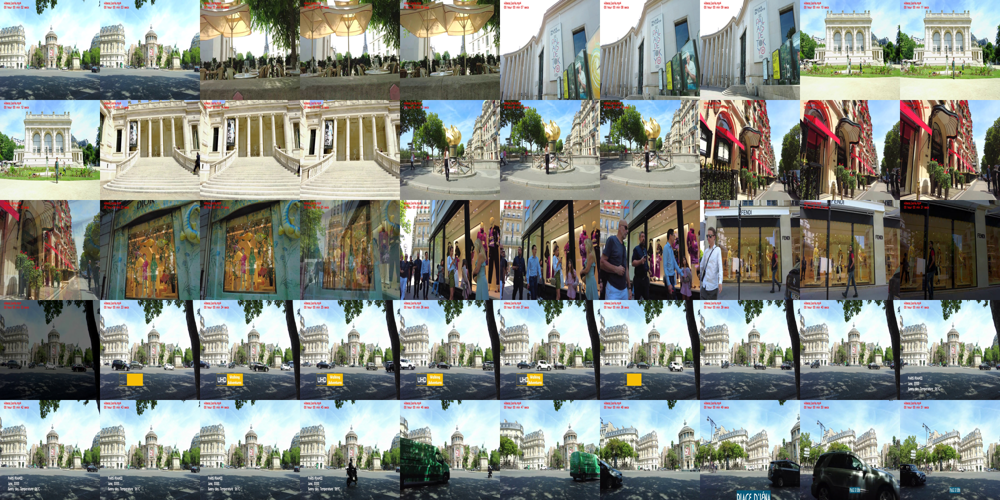

In [6]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

In [7]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

## 3. Loading vector embeddings

In [8]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_25Sep2023_133041.json']

In [9]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_25Sep2023_133041.json

Done: number of imported vector embeddings = 1,448


## 4. Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). 
The search will be made using the image without its background.

In [10]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,448


In [59]:
TEST_DIR = "images"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 5


### Test 1

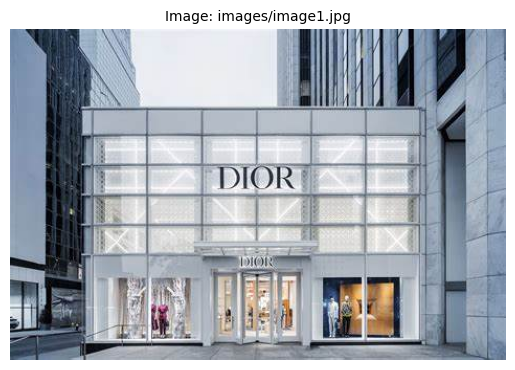

In [60]:
reference_image = test_images[0]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


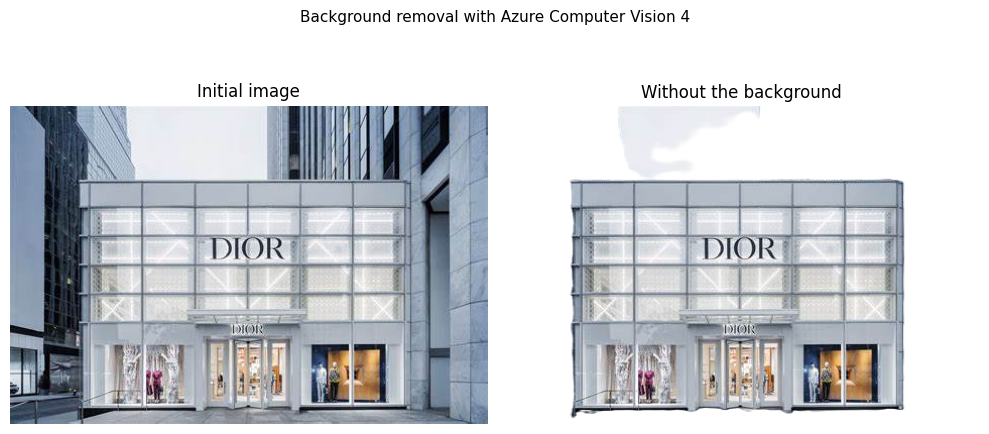

In [61]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_19_37.jpg with similarity index = 0.7597684355735264
002 frames/frame_00_19_38.jpg with similarity index = 0.7319711469620759
003 frames/frame_00_19_31.jpg with similarity index = 0.7274152786669333
004 frames/frame_00_19_30.jpg with similarity index = 0.7176685193993995
005 frames/frame_00_19_32.jpg with similarity index = 0.7142275341047294
006 frames/frame_00_19_36.jpg with similarity index = 0.7021020313670772


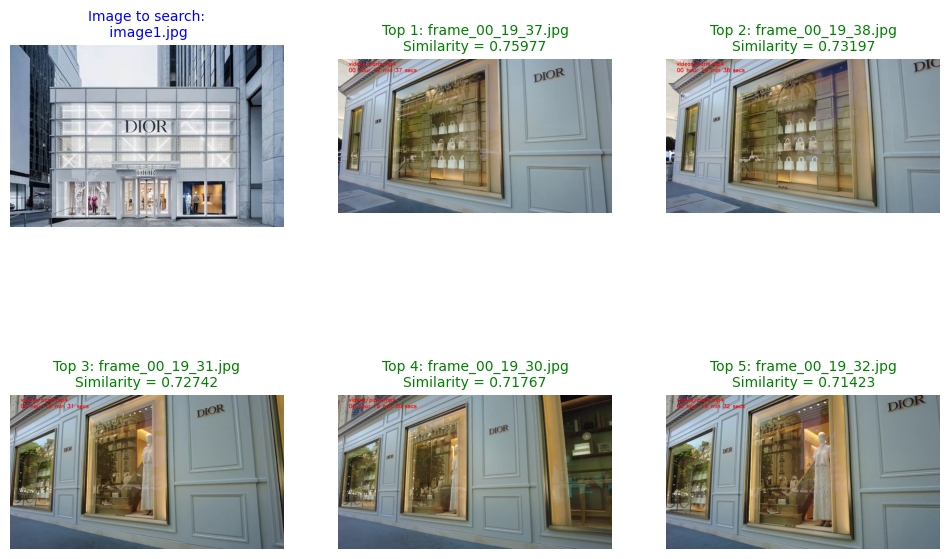

 2023-09-25 13:40:41 Powered by Azure Computer Vision Florence


,image_file,similarity
1176,frames/frame_00_19_37.jpg,0.759768
1177,frames/frame_00_19_38.jpg,0.731971
1170,frames/frame_00_19_31.jpg,0.727415
1169,frames/frame_00_19_30.jpg,0.717669
1171,frames/frame_00_19_32.jpg,0.714228
...,...,...
694,frames/frame_00_11_35.jpg,0.210854
420,frames/frame_00_07_01.jpg,0.209639
421,frames/frame_00_07_02.jpg,0.208353
870,frames/frame_00_14_31.jpg,0.200889


In [62]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

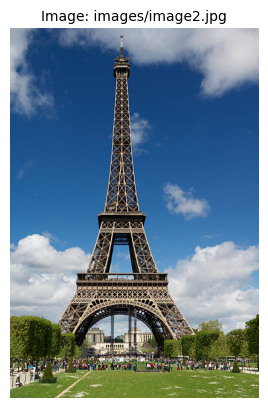

In [63]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


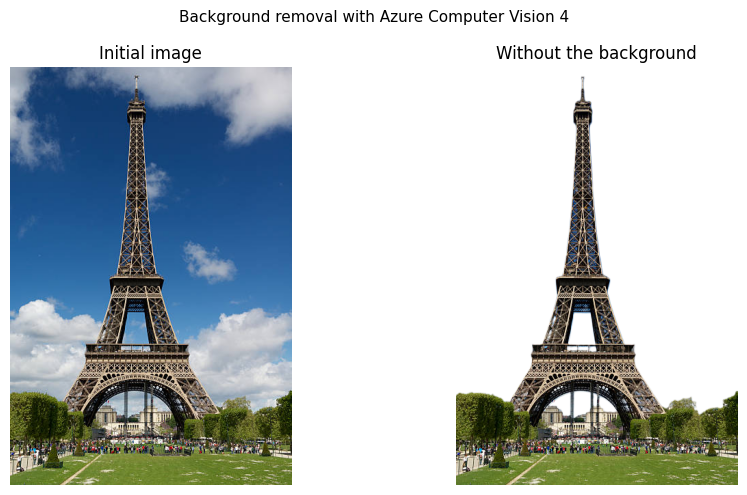

In [64]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_08_12.jpg with similarity index = 0.6494177328701186
002 frames/frame_00_24_08.jpg with similarity index = 0.6464572480270012
003 frames/frame_00_08_03.jpg with similarity index = 0.6341433244900131
004 frames/frame_00_08_19.jpg with similarity index = 0.6323574781742917
005 frames/frame_00_08_04.jpg with similarity index = 0.6304326198304644
006 frames/frame_00_00_04.jpg with similarity index = 0.6303994260398256


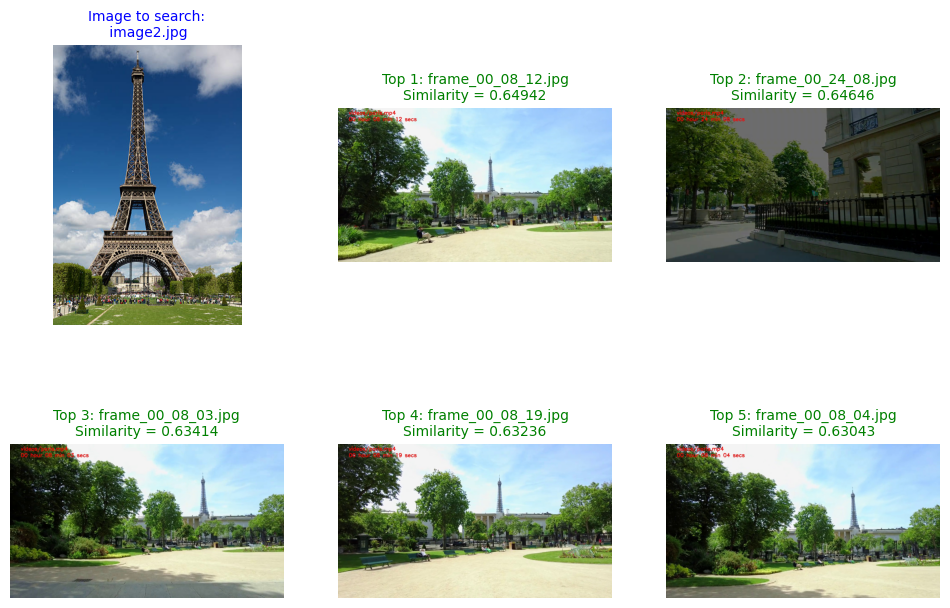

 2023-09-25 13:40:46 Powered by Azure Computer Vision Florence


,image_file,similarity
491,frames/frame_00_08_12.jpg,0.649418
1447,frames/frame_00_24_08.jpg,0.646457
482,frames/frame_00_08_03.jpg,0.634143
498,frames/frame_00_08_19.jpg,0.632357
483,frames/frame_00_08_04.jpg,0.630433
...,...,...
1125,frames/frame_00_18_46.jpg,0.296210
1123,frames/frame_00_18_44.jpg,0.289121
1328,frames/frame_00_22_09.jpg,0.287222
915,frames/frame_00_15_16.jpg,0.272953


In [65]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

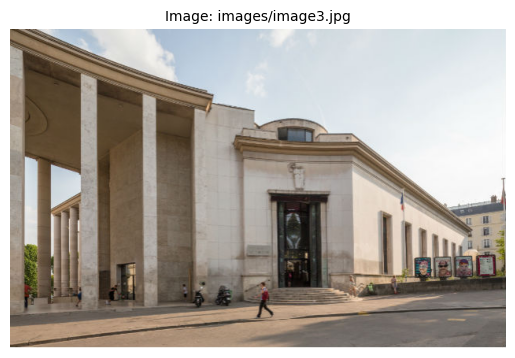

In [66]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


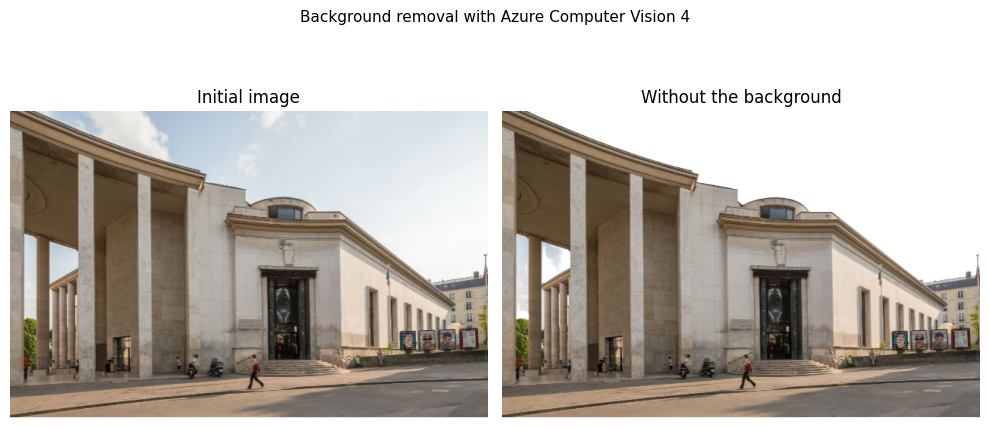

In [67]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_03_27.jpg with similarity index = 0.8092106089450631
002 frames/frame_00_03_17.jpg with similarity index = 0.8045063977105715
003 frames/frame_00_03_18.jpg with similarity index = 0.7790572116147082
004 frames/frame_00_03_28.jpg with similarity index = 0.7787150208432666
005 frames/frame_00_03_26.jpg with similarity index = 0.7778660576716526
006 frames/frame_00_03_24.jpg with similarity index = 0.7724920559448182


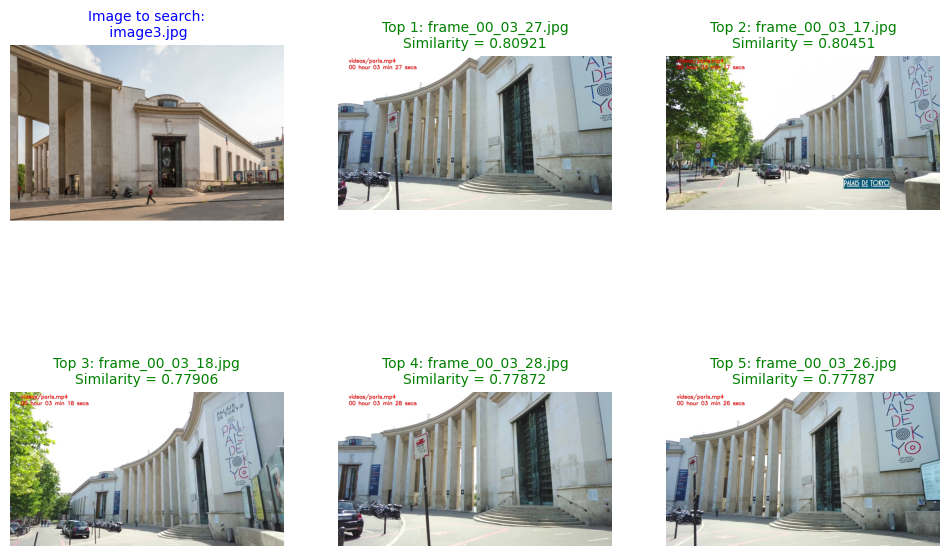

 2023-09-25 13:40:51 Powered by Azure Computer Vision Florence


,image_file,similarity
206,frames/frame_00_03_27.jpg,0.809211
196,frames/frame_00_03_17.jpg,0.804506
197,frames/frame_00_03_18.jpg,0.779057
207,frames/frame_00_03_28.jpg,0.778715
205,frames/frame_00_03_26.jpg,0.777866
...,...,...
1288,frames/frame_00_21_29.jpg,0.319171
1130,frames/frame_00_18_51.jpg,0.315288
1122,frames/frame_00_18_43.jpg,0.303462
1123,frames/frame_00_18_44.jpg,0.298998


In [68]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

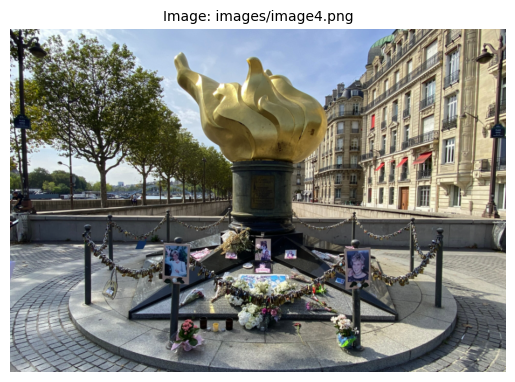

In [69]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


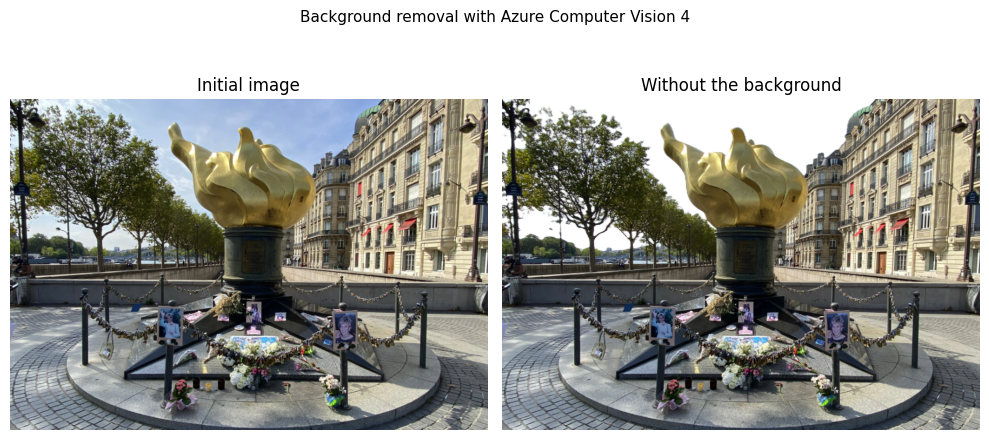

In [70]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_11_44.jpg with similarity index = 0.8270707100505301
002 frames/frame_00_11_43.jpg with similarity index = 0.8082336397066672
003 frames/frame_00_11_20.jpg with similarity index = 0.8078479665665012
004 frames/frame_00_11_52.jpg with similarity index = 0.8042134399039154
005 frames/frame_00_11_24.jpg with similarity index = 0.8021991404454394
006 frames/frame_00_11_41.jpg with similarity index = 0.7997193058198567


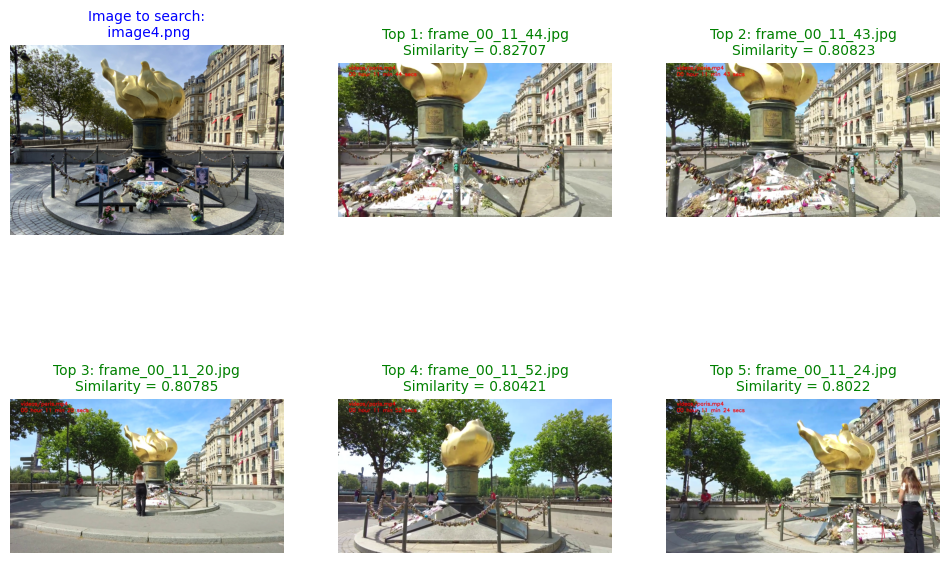

 2023-09-25 13:40:58 Powered by Azure Computer Vision Florence


,image_file,similarity
703,frames/frame_00_11_44.jpg,0.827071
702,frames/frame_00_11_43.jpg,0.808234
679,frames/frame_00_11_20.jpg,0.807848
711,frames/frame_00_11_52.jpg,0.804213
683,frames/frame_00_11_24.jpg,0.802199
...,...,...
1122,frames/frame_00_18_43.jpg,0.289594
1269,frames/frame_00_21_10.jpg,0.288813
1130,frames/frame_00_18_51.jpg,0.288495
1123,frames/frame_00_18_44.jpg,0.284791


In [71]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

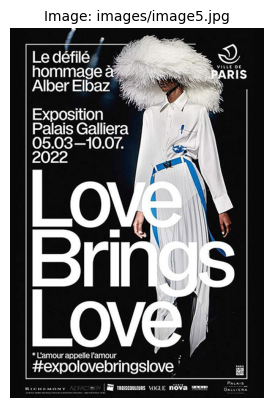

In [72]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


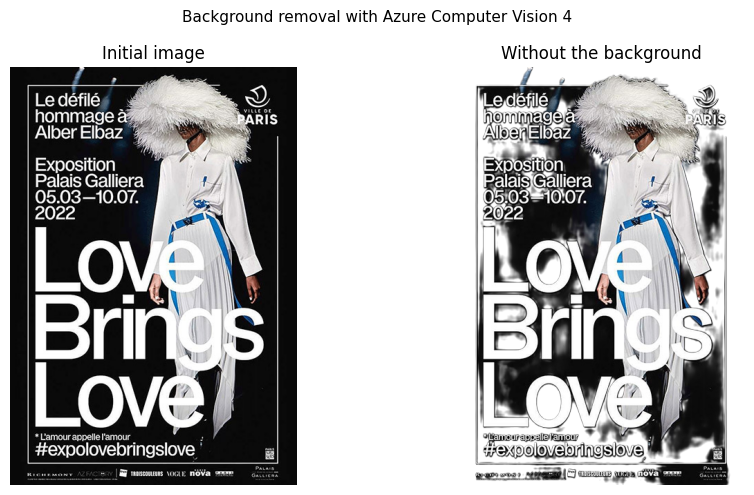

In [73]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 3 images:

001 frames/frame_00_04_58.jpg with similarity index = 0.5602017767747263
002 frames/frame_00_04_56.jpg with similarity index = 0.4952468082286255
003 frames/frame_00_04_57.jpg with similarity index = 0.47052468968329214


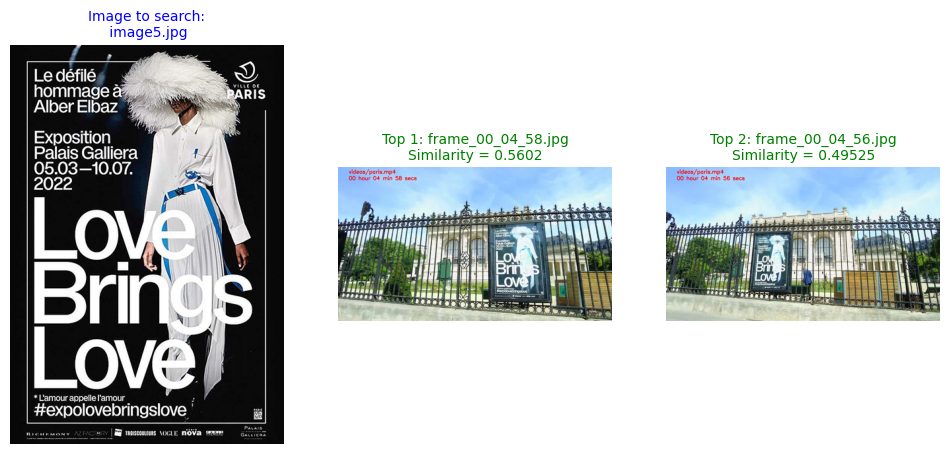

 2023-09-25 13:42:08 Powered by Azure Computer Vision Florence


,image_file,similarity
297,frames/frame_00_04_58.jpg,0.560202
295,frames/frame_00_04_56.jpg,0.495247
296,frames/frame_00_04_57.jpg,0.470525
312,frames/frame_00_05_13.jpg,0.435634
310,frames/frame_00_05_11.jpg,0.426906
...,...,...
266,frames/frame_00_04_27.jpg,0.161088
563,frames/frame_00_09_24.jpg,0.147693
1051,frames/frame_00_17_32.jpg,0.146053
637,frames/frame_00_10_38.jpg,0.134729


In [78]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=3, disp=True
)

## 5. Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [15]:
query = "person wearing a mask"


Similar images using query = person wearing a mask


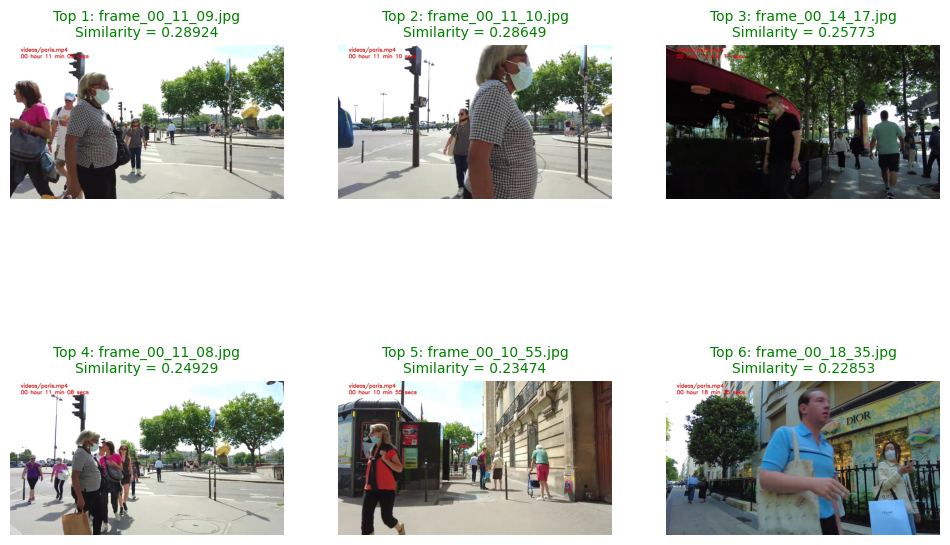

 2023-09-25 13:33:50 Powered by Azure Computer Vision Florence


,image_file,similarity
668,frames/frame_00_11_09.jpg,0.289238
669,frames/frame_00_11_10.jpg,0.286494
856,frames/frame_00_14_17.jpg,0.257729
667,frames/frame_00_11_08.jpg,0.249290
654,frames/frame_00_10_55.jpg,0.234741
...,...,...
1058,frames/frame_00_17_39.jpg,0.072982
40,frames/frame_00_00_41.jpg,0.072777
42,frames/frame_00_00_43.jpg,0.072336
525,frames/frame_00_08_46.jpg,0.070698


In [16]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [17]:
query = "palais de tokyo"


Similar images using query = palais de tokyo


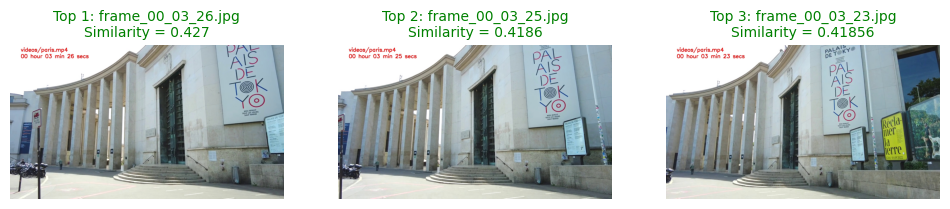

 2023-09-25 13:33:53 Powered by Azure Computer Vision Florence


,image_file,similarity
205,frames/frame_00_03_26.jpg,0.427005
204,frames/frame_00_03_25.jpg,0.418600
202,frames/frame_00_03_23.jpg,0.418563
203,frames/frame_00_03_24.jpg,0.403421
197,frames/frame_00_03_18.jpg,0.400554
...,...,...
976,frames/frame_00_16_17.jpg,0.109563
993,frames/frame_00_16_34.jpg,0.101025
1025,frames/frame_00_17_06.jpg,0.099106
19,frames/frame_00_00_20.jpg,0.095874


In [18]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 3

In [19]:
query = "pink lines on the ground"


Similar images using query = pink lines on the ground


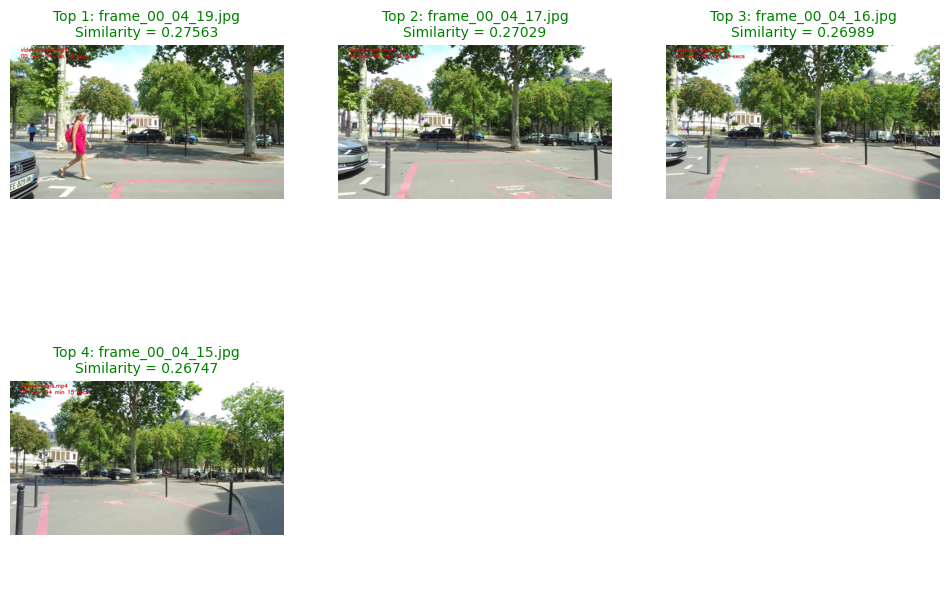

 2023-09-25 13:33:55 Powered by Azure Computer Vision Florence


,image_file,similarity
258,frames/frame_00_04_19.jpg,0.275633
256,frames/frame_00_04_17.jpg,0.270291
255,frames/frame_00_04_16.jpg,0.269889
254,frames/frame_00_04_15.jpg,0.267473
583,frames/frame_00_09_44.jpg,0.241545
...,...,...
1131,frames/frame_00_18_52.jpg,0.104582
1130,frames/frame_00_18_51.jpg,0.103712
640,frames/frame_00_10_41.jpg,0.102899
1189,frames/frame_00_19_50.jpg,0.101117


In [20]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 4

In [21]:
query = "eiffel tower"


Similar images using query = eiffel tower


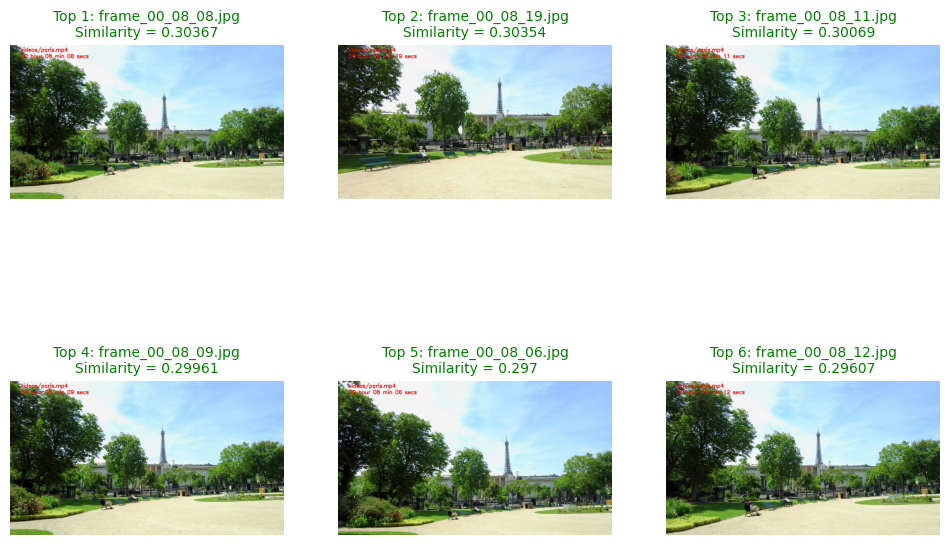

 2023-09-25 13:33:57 Powered by Azure Computer Vision Florence


,image_file,similarity
487,frames/frame_00_08_08.jpg,0.303669
498,frames/frame_00_08_19.jpg,0.303536
490,frames/frame_00_08_11.jpg,0.300687
488,frames/frame_00_08_09.jpg,0.299611
485,frames/frame_00_08_06.jpg,0.296999
...,...,...
1332,frames/frame_00_22_13.jpg,0.165730
1290,frames/frame_00_21_31.jpg,0.161856
1294,frames/frame_00_21_35.jpg,0.160628
911,frames/frame_00_15_12.jpg,0.155174


In [22]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 5

In [23]:
query = "monument with a flame"


Similar images using query = monument with a flame


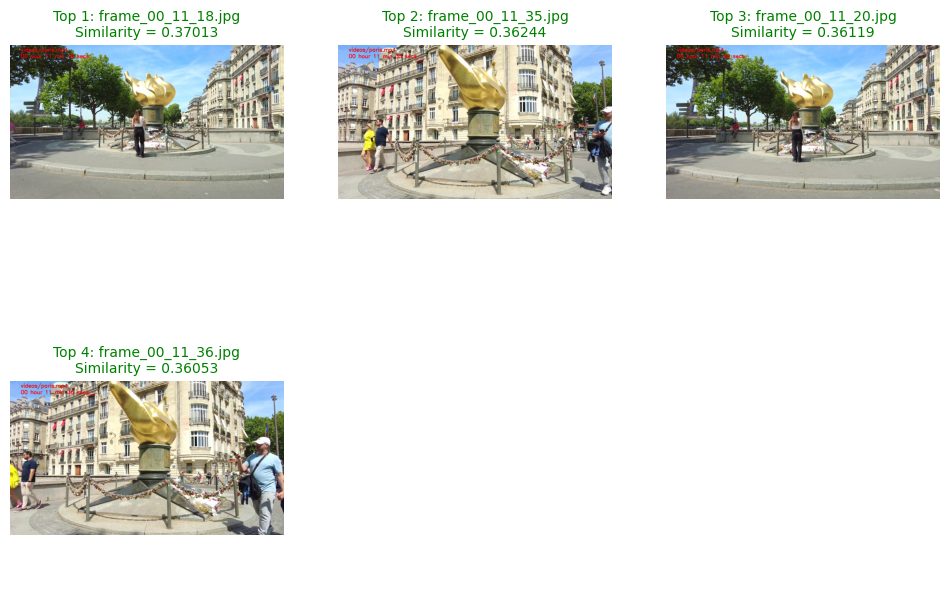

 2023-09-25 13:33:59 Powered by Azure Computer Vision Florence


,image_file,similarity
677,frames/frame_00_11_18.jpg,0.370135
694,frames/frame_00_11_35.jpg,0.362437
679,frames/frame_00_11_20.jpg,0.361194
695,frames/frame_00_11_36.jpg,0.360526
17,frames/frame_00_00_18.jpg,0.359290
...,...,...
23,frames/frame_00_00_24.jpg,0.092438
1290,frames/frame_00_21_31.jpg,0.089158
1179,frames/frame_00_19_40.jpg,0.086640
1292,frames/frame_00_21_33.jpg,0.086478


In [24]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [25]:
query = "dior store"


Similar images using query = dior store


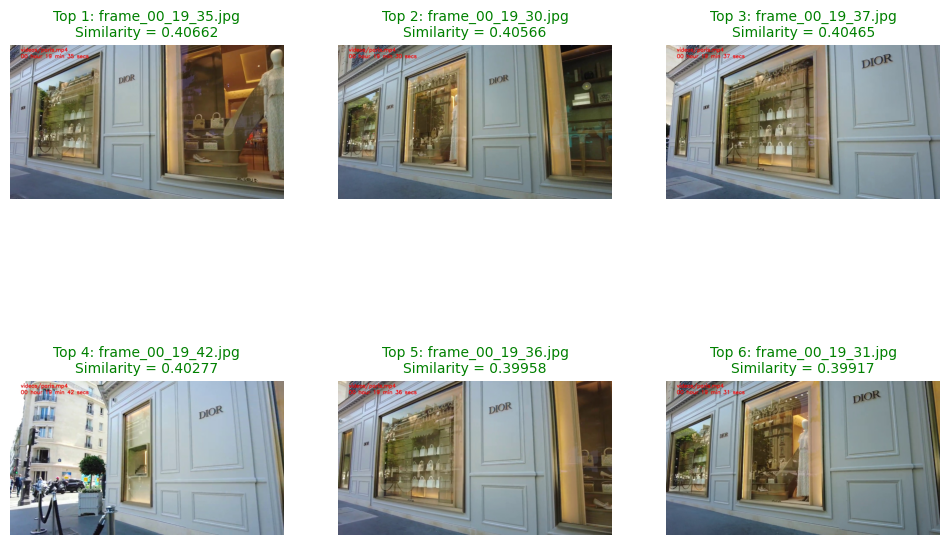

 2023-09-25 13:34:01 Powered by Azure Computer Vision Florence


,image_file,similarity
1174,frames/frame_00_19_35.jpg,0.406622
1169,frames/frame_00_19_30.jpg,0.405665
1176,frames/frame_00_19_37.jpg,0.404646
1181,frames/frame_00_19_42.jpg,0.402774
1175,frames/frame_00_19_36.jpg,0.399581
...,...,...
526,frames/frame_00_08_47.jpg,0.144048
510,frames/frame_00_08_31.jpg,0.141830
637,frames/frame_00_10_38.jpg,0.140907
531,frames/frame_00_08_52.jpg,0.133671


In [26]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 7

In [27]:
query = "outdoor restaurant"


Similar images using query = outdoor restaurant


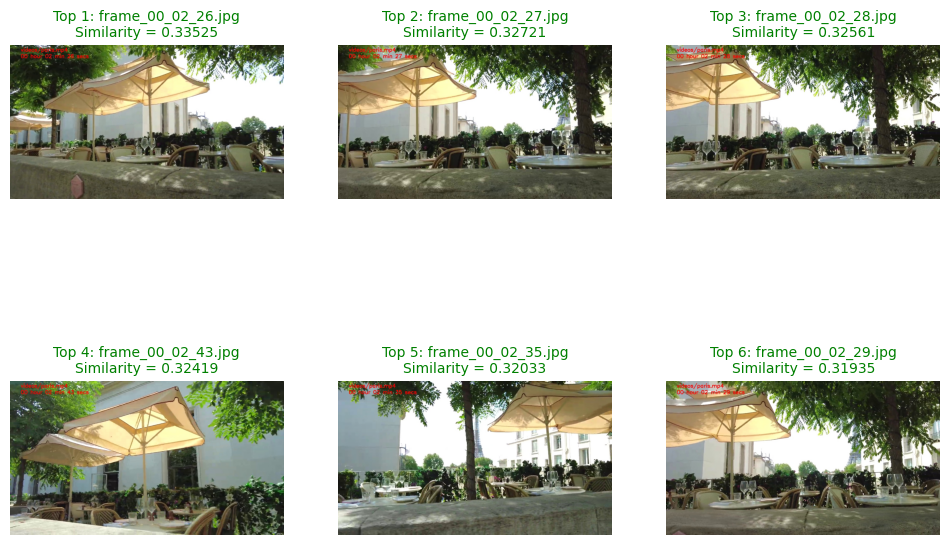

 2023-09-25 13:34:03 Powered by Azure Computer Vision Florence


,image_file,similarity
145,frames/frame_00_02_26.jpg,0.335254
146,frames/frame_00_02_27.jpg,0.327211
147,frames/frame_00_02_28.jpg,0.325610
162,frames/frame_00_02_43.jpg,0.324187
154,frames/frame_00_02_35.jpg,0.320329
...,...,...
420,frames/frame_00_07_01.jpg,0.116217
432,frames/frame_00_07_13.jpg,0.114735
433,frames/frame_00_07_14.jpg,0.114520
431,frames/frame_00_07_12.jpg,0.113999


In [28]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 8

In [29]:
query = "garden"


Similar images using query = garden


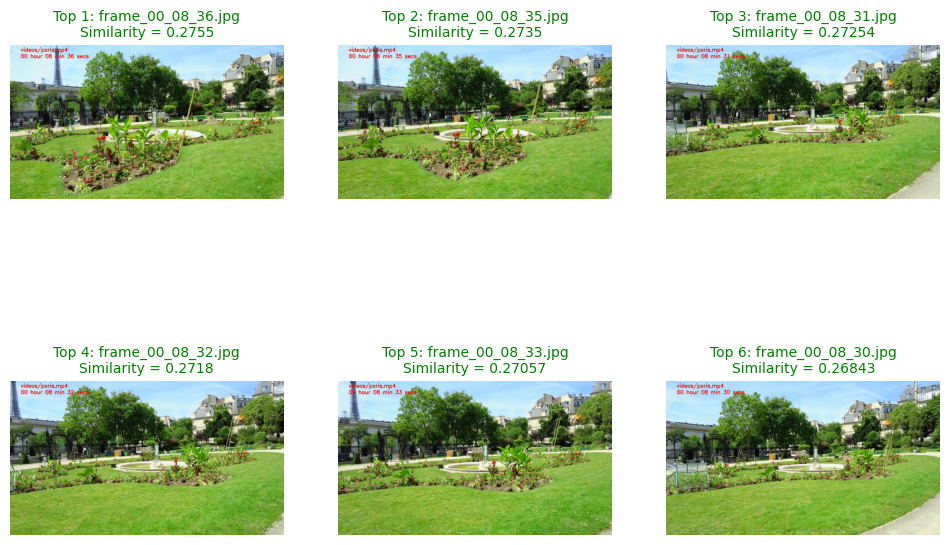

 2023-09-25 13:34:06 Powered by Azure Computer Vision Florence


,image_file,similarity
515,frames/frame_00_08_36.jpg,0.275503
514,frames/frame_00_08_35.jpg,0.273504
510,frames/frame_00_08_31.jpg,0.272543
511,frames/frame_00_08_32.jpg,0.271800
512,frames/frame_00_08_33.jpg,0.270567
...,...,...
1177,frames/frame_00_19_38.jpg,0.112757
1292,frames/frame_00_21_33.jpg,0.111546
25,frames/frame_00_00_26.jpg,0.110643
27,frames/frame_00_00_28.jpg,0.109923


In [30]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [31]:
query = "busy street"

Top 6 images:

001 frames/frame_00_12_44.jpg with similarity index = 0.33097710385855805
002 frames/frame_00_12_46.jpg with similarity index = 0.3219895123374625
003 frames/frame_00_12_42.jpg with similarity index = 0.3172192204360951
004 frames/frame_00_12_45.jpg with similarity index = 0.3123553142049307
005 frames/frame_00_12_52.jpg with similarity index = 0.3076278653783942
006 frames/frame_00_12_47.jpg with similarity index = 0.30695108659533205

Similar images using query = busy street


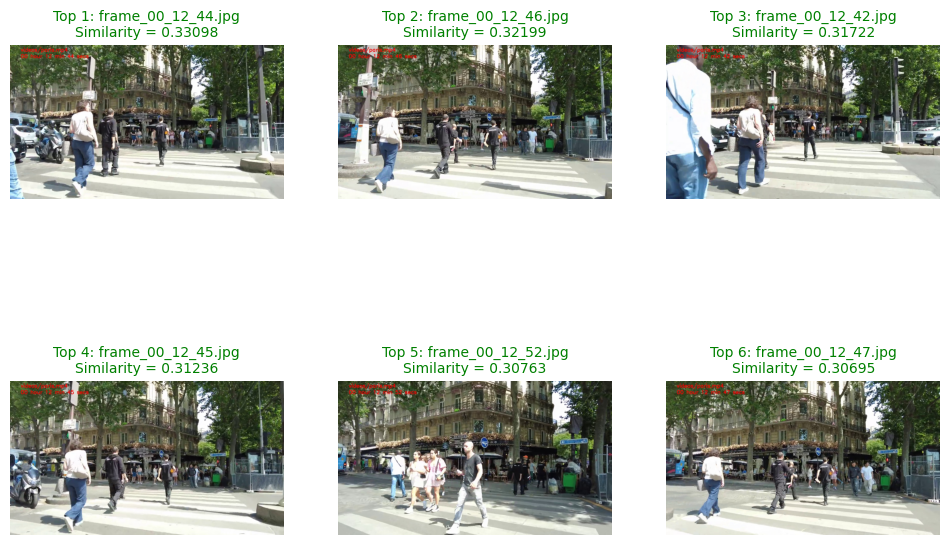

 2023-09-25 13:34:08 Powered by Azure Computer Vision Florence


,image_file,similarity
763,frames/frame_00_12_44.jpg,0.330977
765,frames/frame_00_12_46.jpg,0.321990
761,frames/frame_00_12_42.jpg,0.317219
764,frames/frame_00_12_45.jpg,0.312355
771,frames/frame_00_12_52.jpg,0.307628
...,...,...
416,frames/frame_00_06_57.jpg,0.080095
432,frames/frame_00_07_13.jpg,0.078631
428,frames/frame_00_07_09.jpg,0.077698
431,frames/frame_00_07_12.jpg,0.074020


In [32]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=True)

### Test 10

In [33]:
query = "empty street"


Similar images using query = empty street


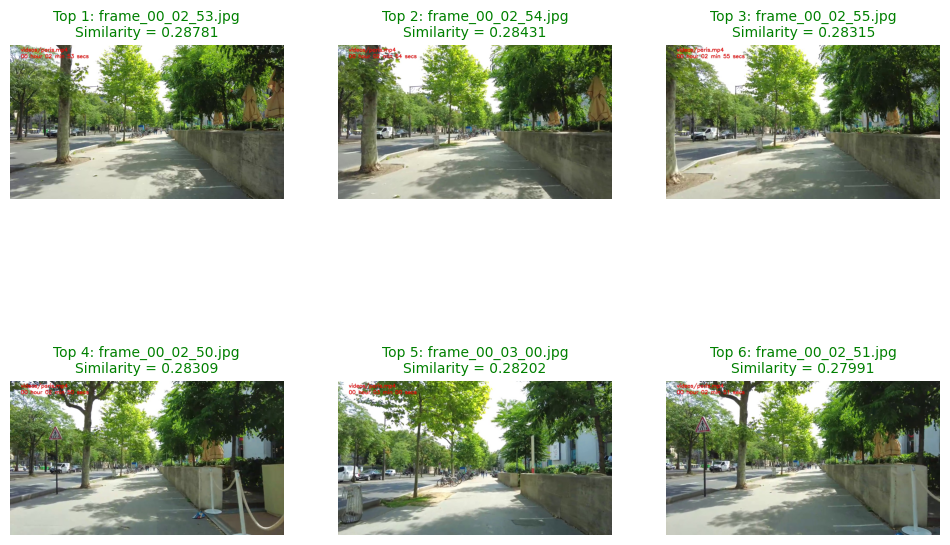

 2023-09-25 13:34:11 Powered by Azure Computer Vision Florence


,image_file,similarity
172,frames/frame_00_02_53.jpg,0.287814
173,frames/frame_00_02_54.jpg,0.284306
174,frames/frame_00_02_55.jpg,0.283148
169,frames/frame_00_02_50.jpg,0.283093
179,frames/frame_00_03_00.jpg,0.282015
...,...,...
431,frames/frame_00_07_12.jpg,0.118975
1130,frames/frame_00_18_51.jpg,0.115745
1132,frames/frame_00_18_53.jpg,0.115583
23,frames/frame_00_00_24.jpg,0.112760


In [34]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

> In the next notebook we will create a webapp with Gradio